In [99]:
from jax import config
config.update('jax_platform_name', 'cpu')
config.update("jax_enable_x64", True)

from jax import jit, grad, vmap, random
from jax import numpy as jnp
import numpy as np
from matplotlib import pyplot as plt

from functools import partial

In [100]:
%config InlineBackend.figure_format = 'svg'
plt.style.use(['thesis','ghd-notebook-svg'])

In [101]:
from sde_tools.data_funcs import argmax_ij

## Figures

### A-B Optimality plot

In [288]:
P_RESULTS_DIR = "ab_performance_results/param_points_100/d1_thresh_0-5"
P_FILE = "P_thresh_np100_10e3"

N = 20
P_array = np.zeros((100,100,N))
for i in range(N):
    P_array[...,i] = np.loadtxt(f"{P_RESULTS_DIR}/{P_FILE}_{i}.txt")
P = P_array.mean(-1)

In [289]:
N_param_samples = 100
a_array = np.logspace(-5,1, N_param_samples)
b_array = np.logspace(-1,5, N_param_samples)

a_idx, b_idx = argmax_ij(P)

a_max, b_max = a_array[a_idx], b_array[b_idx]
a_max, b_max = a_array[b_idx], b_array[a_idx]
print(np.log10(a_max),np.log10(b_max))

-1.2424242424242422 1.4848484848484849


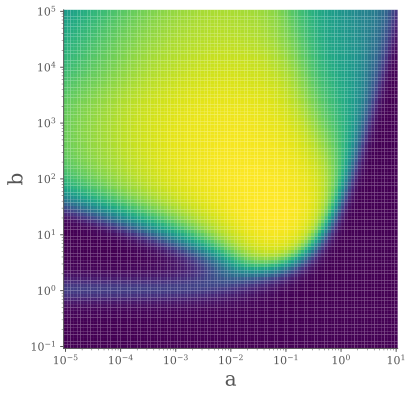

In [290]:
β = 1.
O = np.exp(P*β)
#O = -np.log(1-P)
#O = (P)/(1-P)

N_param_samples = 100
a_array = np.logspace(-5,1, N_param_samples)
b_array = np.logspace(-1,5, N_param_samples)

A, B = np.meshgrid(a_array,b_array)

fig, ax = plt.subplots(figsize=(6,6))

#ax.pcolormesh(A,B,O,shading="gouraud");
ax.pcolormesh(A,B,O);
ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("a",fontsize=20)
ax.set_ylabel("b",fontsize=20);

In [316]:
N_param_samples = 100
a_array = np.logspace(-5,1, N_param_samples)
b_array = np.logspace(-1,5, N_param_samples)

A, B = np.meshgrid(a_array,b_array)

fig, axs = plt.subplots(1,2,figsize=(8,4))

beta_array = [1.,10.]

for β,ax in zip(beta_array,axs):
    O = np.exp(P*β)
    ax.pcolormesh(A,B,O);
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel("a",fontsize=15)
    ax.set_ylabel("b",fontsize=15);
    ax.text(0.07, 0.07, r"$\beta = {}$".format(β),color="w",transform=ax.transAxes)
    
plt.tight_layout()

In [ ]:
%config InlineBackend.figure_format = 'svg'

### Plotting trajectories for different parameters 

In [406]:
from sde_systems.jax_delta_notch_tools import sample_y0_DN_jit, DN_sdeint
from sde_systems.delta_notch_tools import (drop_nans_DN,
                                           plot_delta_delta_time_course_multi, 
                                           plot_DN_state_space)

In [407]:
loga, logb = -1.4, 2.0
args1 = (10**loga,10**logb,4.,4.,0.05)

a, b = 0.1, 10e3
args2 = (a,b,4.,4.,0.05)

n_samples = 20

key = random.PRNGKey(111)
keys = random.split(key,n_samples)
y0 = sample_y0_DN_jit(key,n_samples=n_samples)

ys_ab1 = DN_sdeint(y0,keys,args1)
ys_ab2 = DN_sdeint(y0,keys,args2)

nan_mask1 = np.isnan(ys_ab1).any((1, 2))
nan_mask2 = np.isnan(ys_ab2).any((1, 2))
nan_mask_comb = nan_mask1 | nan_mask2

ys_ab1, ys_ab2 = ys_ab1[~nan_mask_comb], ys_ab2[~nan_mask_comb]

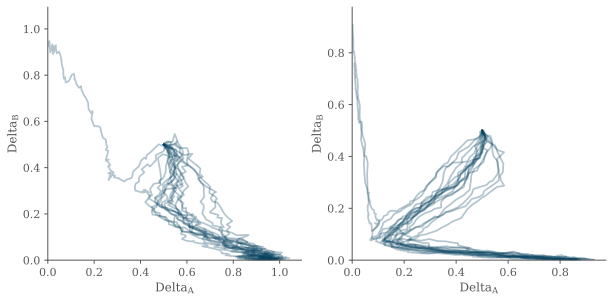

In [408]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,5))

plot_DN_state_space(ys_ab1[...,2:], ax = ax1);
plot_DN_state_space(ys_ab2[...,2:], ax = ax2);

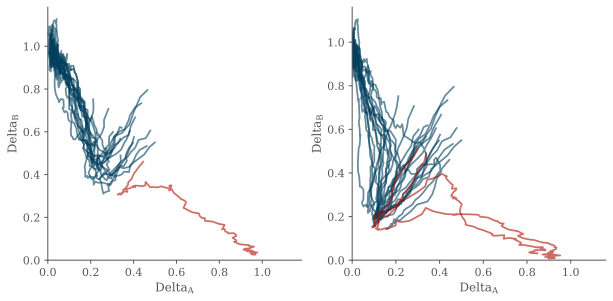

In [411]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,5))

dA1, dB1 = ys_ab1[:,-1,:2].T
plot_DN_state_space(ys_ab1[dA1 < dB1],ax = ax1, alpha=0.6);
if (dA1 > dB1).any():
    plot_DN_state_space(ys_ab1[dA1 > dB1],ax = ax1, color="C5", alpha=0.6);

dA1, dB1 = ys_ab2[:,-1,:2].T
plot_DN_state_space(ys_ab2[dA1 < dB1],ax = ax2, alpha=0.6);
if (dA1 > dB1).any():
    plot_DN_state_space(ys_ab2[dA1 > dB1],ax = ax2, color="C5", alpha=0.6);
    

In [343]:
from sde_systems.jax_delta_notch_tools import sample_y0_DN_jit, DN_sdeint
from sde_systems.delta_notch_tools import (drop_nans_DN,
                                           plot_delta_delta_time_course_multi, 
                                           plot_DN_state_space)

loga, logb = -1.4, 2.0
args1 = (10**loga,10**logb,4.,4.,0.05)

a, b = 0.1, 10e3
args2 = (a,b,4.,4.,0.05)

n_samples = 20

key = random.PRNGKey(111)
keys = random.split(key,n_samples)
y0 = sample_y0_DN_jit(key,n_samples=n_samples)

ys_ab1 = DN_sdeint(y0,keys,args1)
ys_ab1 = drop_nans_DN(ys_ab1)

ys_ab2 = DN_sdeint(y0,keys,args2)
ys_ab2 = drop_nans_DN(ys_ab2)

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,4))

dA1, dB1 = ys_ab1[:,-1,:2].T
plot_DN_state_space(ys_ab1[dA1 < dB1],ax = ax1, alpha=0.6);
if (dA1 > dB1).any():
    plot_DN_state_space(ys_ab1[dA1 > dB1],ax = ax1, color="C5", alpha=0.6);

dA1, dB1 = ys_ab2[:,-1,:2].T
plot_DN_state_space(ys_ab2[dA1 < dB1],ax = ax2, alpha=0.6);
if (dA1 > dB1).any():
    plot_DN_state_space(ys_ab2[dA1 > dB1],ax = ax2, color="C5", alpha=0.6);

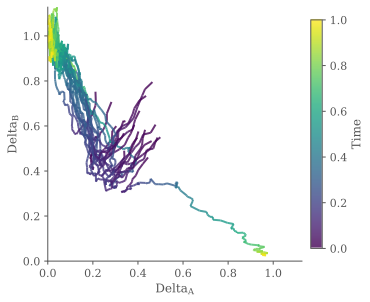

In [334]:
plot_delta_delta_time_course_multi(ys_ab1)

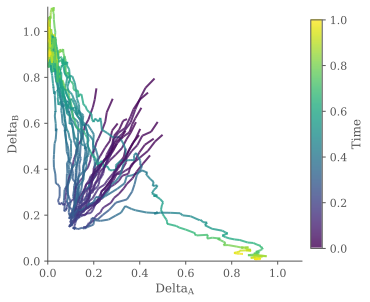

In [335]:
plot_delta_delta_time_course_multi(ys_ab2)

### Gradient Ascent

#### Perf vs itr

In [291]:
OPT_RESULTS_DIR = "ab_grad_results/log_opt/thresh_perf/"
OPT_FILE = "log_thresh_opt_ab0"
opt_results_files_suffixes = ["4_1","4_4","0_0-5", "0_4-8"]

perfs = np.zeros((200,len(opt_results_files_suffixes)))
for n,sfx in enumerate(opt_results_files_suffixes):
    perfs[...,n] = np.loadtxt(f"{OPT_RESULTS_DIR}/perf_{OPT_FILE}_{sfx}.txt")[:200]

In [310]:
p_opt = perfs[100:,:].mean()
print(f"{p_opt:.3f}")
p_opt * 0.965

0.950


0.9170402990680846

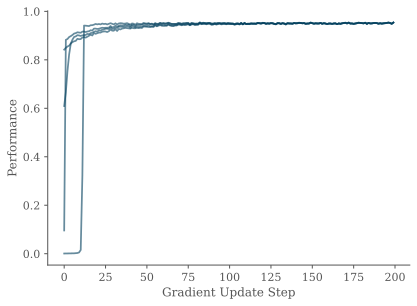

In [292]:
fig, ax = plt.subplots()
itrs = np.arange(len(perfs))

for traj in perfs.T:
    ax.plot(itrs,traj,"C0",alpha=0.6);

ax.set_xlabel("Gradient Update Step");
ax.set_ylabel("Performance");

### Params vs Itr

In [392]:
OPT_RESULTS_DIR = "ab_grad_results/log_opt/thresh_perf/"
OPT_FILE = "log_thresh_opt_ab0"
opt_results_files_suffixes = ["4_1","4_4","0_0-5", "0_4-8"]

params = np.zeros((200,2,len(opt_results_files_suffixes)))
for n,sfx in enumerate(opt_results_files_suffixes):
    params[...,n] = np.loadtxt(f"{OPT_RESULTS_DIR}/param_{OPT_FILE}_{sfx}.txt")[:200,...]

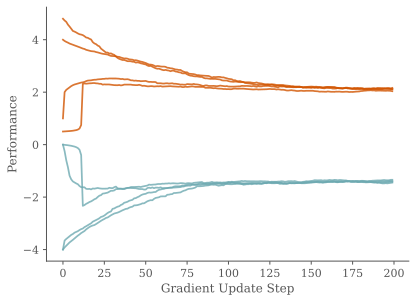

In [393]:
fig, ax = plt.subplots()
itrs = np.arange(len(perfs))

for a_traj in params[:,0,:].T:
    ax.plot(itrs,a_traj,"C2",alpha=0.8);
    
for b_traj in params[:,1,:].T:
    ax.plot(itrs,b_traj,"C1",alpha=0.8);

ax.set_xlabel("Gradient Update Step");
ax.set_ylabel("Performance");

In [395]:
a_mean, b_mean = params[-50:].mean((0))

In [401]:
print(f"a range: {10**a_mean.min():.3f}, {10**a_mean.max():.3f}")
print(f"b range: {10**b_mean.min():.3f}, {10**b_mean.max():.3f}")

a range: 0.037, 0.043
b range: 108.597, 142.770


In [405]:
print(f"a mean: {10**a_mean.mean():.3f}")
print(f"b mean {10**b_mean.mean():.3f}")

a mean: 0.039
b mean 132.523


#### A-B trajectory

In [388]:
P_RESULTS_DIR = "ab_performance_results/param_points_100/d1_thresh_0-5"
P_FILE = "P_thresh_np100_10e3"
N = 20
P_array = np.zeros((100,100,N))
for i in range(N):
    P_array[...,i] = np.loadtxt(f"{P_RESULTS_DIR}/{P_FILE}_{i}.txt")
P = P_array.mean(-1)

OPT_RESULTS_DIR = "ab_grad_results/log_opt/thresh_perf/"
OPT_FILE = "log_thresh_opt_ab0"
opt_results_files_suffixes = ["4_1","4_4","0_0-5", "0_4-8"]

params = np.zeros((200,2,len(opt_results_files_suffixes)))
perfs = np.zeros((200,len(opt_results_files_suffixes)))
for n,sfx in enumerate(opt_results_files_suffixes):
    params[...,n] = np.loadtxt(f"{OPT_RESULTS_DIR}/param_{OPT_FILE}_{sfx}.txt")[:200,:]
    perfs[...,n] = np.loadtxt(f"{OPT_RESULTS_DIR}/perf_{OPT_FILE}_{sfx}.txt")[:200]

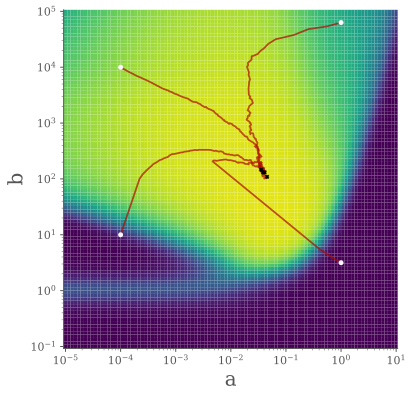

In [415]:
N_param_samples = 100
a_array = np.logspace(-5,1, N_param_samples)
b_array = np.logspace(-1,5, N_param_samples)

A, B = np.meshgrid(a_array,b_array)

fig, ax = plt.subplots(figsize=(6,6))

hm = ax.pcolormesh(A,B,P,vmin=0,vmax=1)

for n in range(params.shape[-1]):
    a, b = (10**params[...,n]).T
    ax.plot(a,b,'C5',alpha=0.7)
    ax.plot(a[0],b[0],'o',markersize=5,c='#fcf5fc')
    ax.scatter(a[-1],b[-1],marker='x',s=10,color='k',zorder=10)

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("a",fontsize=20)
ax.set_ylabel("b",fontsize=20);


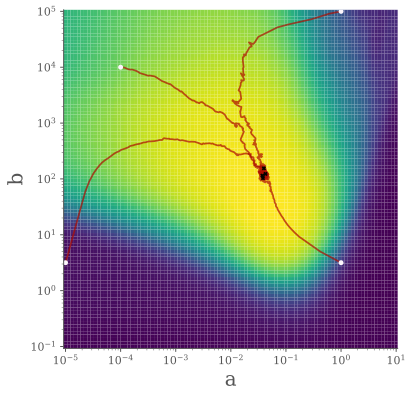

In [196]:
### LOAD RESULTS ###
P_RESULTS_DIR = "ab_performance_results/param_points_100"
N = 20
P_array = np.zeros((100,100,N))
for i in range(N):
    P_array[...,i] = np.loadtxt(f"{P_RESULTS_DIR}/P_np100_10e3_{i}.txt")
P = P_array.mean(-1)

OPT_RESULTS_DIR = "ab_grad_results/log_opt/lr1-1/"
opt_results_files_suffixes = ["0_5","4_4","0_0-5", "5_0-5"]

params = np.zeros((500,2,len(opt_results_files_suffixes)))
perfs = np.zeros((500,len(opt_results_files_suffixes)))
for n,sfx in enumerate(opt_results_files_suffixes):
    params[...,n] = np.loadtxt(f"{OPT_RESULTS_DIR}/param_log_opt_ab0_{sfx}.txt")[:500,:]
    perfs[...,n] = np.loadtxt(f"{OPT_RESULTS_DIR}/perf_log_opt_ab0_{sfx}.txt")[:500]

### PLOT RESULTS ###
N_param_samples = 100
a_array = np.logspace(-5,1, N_param_samples)
b_array = np.logspace(-1,5, N_param_samples)

A, B = np.meshgrid(a_array,b_array)

fig, ax = plt.subplots(figsize=(6,6))

ax.pcolormesh(A,B,P)

for n in range(params.shape[-1]):
    a, b = (10**params[...,n]).T
    ax.plot(a,b,'C5',alpha=0.7)
    ax.plot(a[0],b[0],'o',markersize=5,c='#fcf5fc')
    ax.scatter(a[-1],b[-1],marker='x',s=10,color='k',zorder=10)

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("a",fontsize=20)
ax.set_ylabel("b",fontsize=20);

### Sigmoid Curve

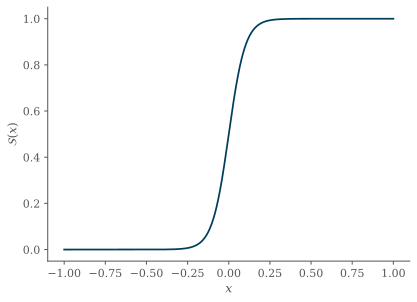

In [434]:
def sigmoid(x,k):
    return 1/(1 + np.exp(-k*x))

fig, ax = plt.subplots()

x = np.linspace(-1,1,1000)
ax.plot(x,sigmoid(x,20));

ax.set_xlabel("$x$");
ax.set_ylabel(r"$\mathcal{S}(x)$");

### Timings

In [418]:
from sde_systems.jax_delta_notch_tools import (sample_y0_DN_jit,
                                               DN_sdeint,
                                               ab_perf_single_no_jit)
from sde_tools.data_funcs import drop_nans

In [423]:
args = (0.01,100.,4.,4.,0.05)

n_samples = 20000

key = random.PRNGKey(112)
keys = random.split(key,n_samples)
y0 = sample_y0_DN_jit(key,n_samples=n_samples)

In [424]:
%%timeit
ys = DN_sdeint(y0,keys,args)

12min 17s ± 39.2 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [425]:
%%timeit -r 1 -n 1
ys = DN_sdeint(y0,keys,args)

10min 31s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)
